## Common Embedding for scAML blasts

In [1]:
import sys 
lab_path="/Users/andyzeng/Drive/Laptop/Dick_Lab/"

import pandas as pd
import seaborn as sns
import numpy as np
import scanpy as sc
import anndata as ad
import matplotlib as mpl
import matplotlib.pyplot as plt

from IPython.display import HTML, display

In [2]:
import rpy2.rinterface_lib.callbacks
import logging

from rpy2.robjects import pandas2ri
import anndata2ri

In [3]:
# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

# LSPC SAM Clustering

In [4]:
def scale_series(series): 
    return((series - np.mean(series))/np.std(series))


def load_sample_scran_normalized(gem_path, anno_path, scale = False, score_genesets = True, min_cells = 2):    

    dat = sc.read_csv(gem_path, delimiter=',')
    dat = ad.AnnData.transpose(dat)
    dat.obs = pd.read_csv(anno_path, delimiter=',').set_index('Cell')
    #dat = dat[dat.obs.CellType.isin(['HSC-like', 'Prog-like'])]# & (dat.obs.CyclingBinary == "no")]
    
    sc.pp.filter_genes(dat, min_cells = min_cells)
    if scale == True:
        sc.pp.scale(dat)
        
    return dat

In [5]:
def load_vangalen(dem_path, anno_path, scale = False):
    dat = sc.read_csv(dem_path, delimiter='\t')
    dat = ad.AnnData.transpose(dat)
    dat_anno = pd.read_csv(anno_path, delimiter='\t')
    dat.obs = dat_anno.set_index('Cell')
    
    if scale == True: 
        sc.pp.scale(dat)
    
    sc.pp.filter_genes(dat, min_cells = 1)
    return dat

In [6]:
import warnings
warnings.filterwarnings('ignore')
AMLcat_dir=lab_path+"scRNA_HSC/sam/scran_normalized/pvg_AML/LSC/LSPC_dormancy/full_hierarchy/"

## Reclustering HSC-like and Prog-like Cells  

#### LSPC Feature Weights
I'm going to load the samples with the highest number of HSC/Prog-like cells, and then identify key feature weights for each of them using SAM   
I'm then going to combine those weights and apply it to all of HSC/Prog-like cells from all of the samples

In [731]:
# AML916, AML921A, AML328, AML707B
AMLcat = sc.read_h5ad(AMLcat_dir+'AMLCat_HSCProg_Full_Hierarchy.h5ad')
print(AMLcat.obs.index.str.replace("-D.*$", "").value_counts())

AML916 = AMLcat[AMLcat.obs.batch == "0"]
AML328 = AMLcat[AMLcat.obs.batch == "1"]
AML921A = AMLcat[AMLcat.obs.batch == "2"]
AML707B = AMLcat[AMLcat.obs.batch == "3"]

AML921A    3813
AML707B    1586
AML328     1094
AML916      933
Name: index, dtype: int64


RUNNING SAM
Iteration: 0, Convergence: 0.6977202591067923
Iteration: 1, Convergence: 0.30980098588093596
Iteration: 2, Convergence: 0.0610740549605761
Iteration: 3, Convergence: 0.013347894478409816
Iteration: 4, Convergence: 0.0075355331314807
Iteration: 5, Convergence: 0.00570093081406506
Iteration: 6, Convergence: 0.0050520015420199476
Computing the UMAP embedding...
Elapsed time: 16.483534812927246 seconds


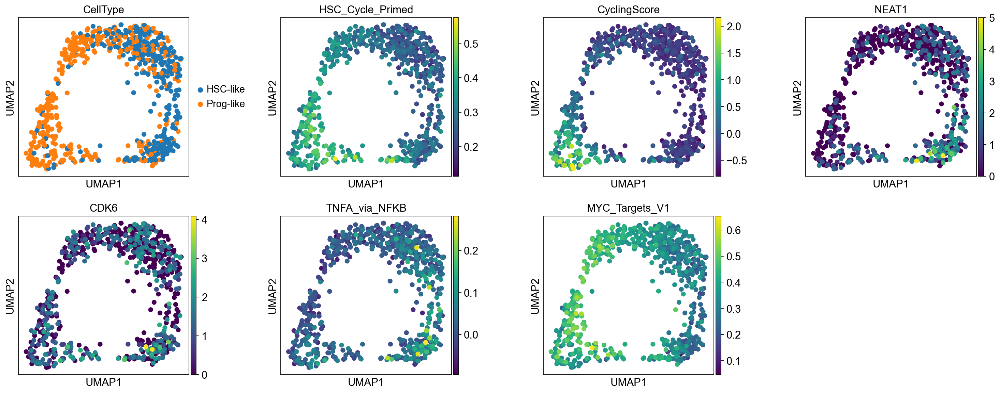

In [88]:
sam916 = sc.external.tl.sam(AML916[AML916.obs.CellType.isin(['HSC-like', 'Prog-like'])], standardization="StandardScaler", inplace=True)
sc.pl.umap(sam916.adata, color=['CellType', 'HSC_Cycle_Primed', 'CyclingScore', 'NEAT1', 'CDK6', 'TNFA_via_NFKB', 'MYC_Targets_V1'], wspace=0.4)

RUNNING SAM
Iteration: 0, Convergence: 0.6561515468590121
Iteration: 1, Convergence: 0.2857886683652859
Iteration: 2, Convergence: 0.06347632355282418
Iteration: 3, Convergence: 0.015990469299286512
Iteration: 4, Convergence: 0.0069710056795063416
Computing the UMAP embedding...
Elapsed time: 16.194907188415527 seconds


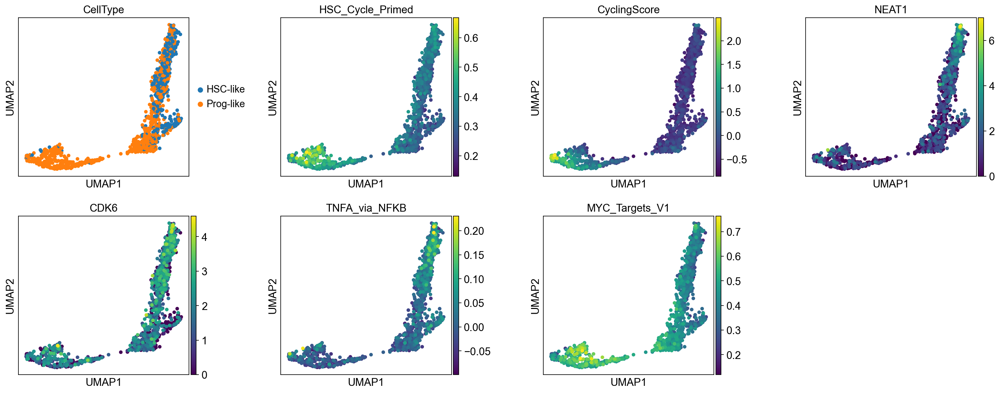

In [89]:
sam921 = sc.external.tl.sam(AML921A[AML921A.obs.CellType.isin(['HSC-like', 'Prog-like'])], standardization="StandardScaler", inplace=True)
sc.pl.umap(sam921.adata, color=['CellType', 'HSC_Cycle_Primed', 'CyclingScore', 'NEAT1', 'CDK6', 'TNFA_via_NFKB', 'MYC_Targets_V1'], wspace=0.4)

RUNNING SAM
Iteration: 0, Convergence: 0.5561102239331184
Iteration: 1, Convergence: 0.19496620923990585
Iteration: 2, Convergence: 0.05407078572807654
Iteration: 3, Convergence: 0.012557614887158553
Iteration: 4, Convergence: 0.006160583258294099
Iteration: 5, Convergence: 0.0050687365313822836
Computing the UMAP embedding...
Elapsed time: 11.088243246078491 seconds


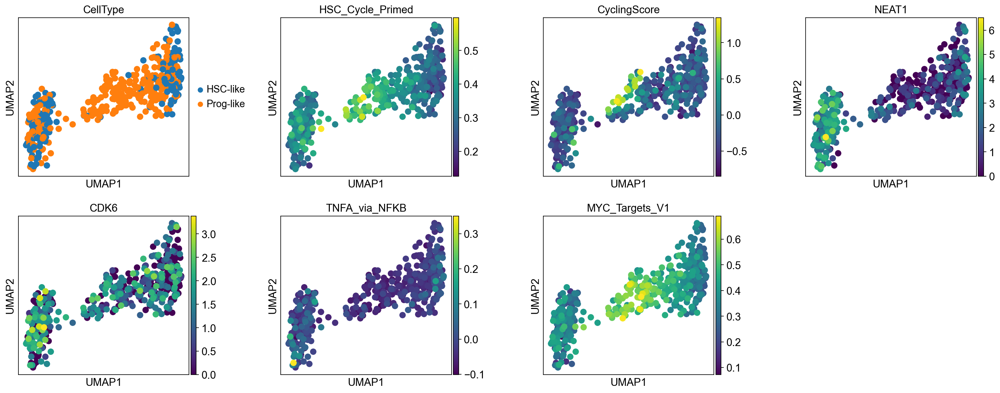

In [90]:
sam328 = sc.external.tl.sam(AML328[AML328.obs.CellType.isin(['HSC-like', 'Prog-like'])], standardization="StandardScaler", inplace=True)
sc.pl.umap(sam328.adata, color=['CellType', 'HSC_Cycle_Primed', 'CyclingScore', 'NEAT1', 'CDK6', 'TNFA_via_NFKB', 'MYC_Targets_V1'], wspace=0.4)

RUNNING SAM
Iteration: 0, Convergence: 0.5864347720852426
Iteration: 1, Convergence: 0.16669774502072696
Iteration: 2, Convergence: 0.0828403029722768
Iteration: 3, Convergence: 0.017935300574340073
Iteration: 4, Convergence: 0.008016347974440395
Iteration: 5, Convergence: 0.006054615448302315
Iteration: 6, Convergence: 0.005385765309487155
Iteration: 7, Convergence: 0.005287113669396132
Computing the UMAP embedding...
Elapsed time: 10.375599145889282 seconds


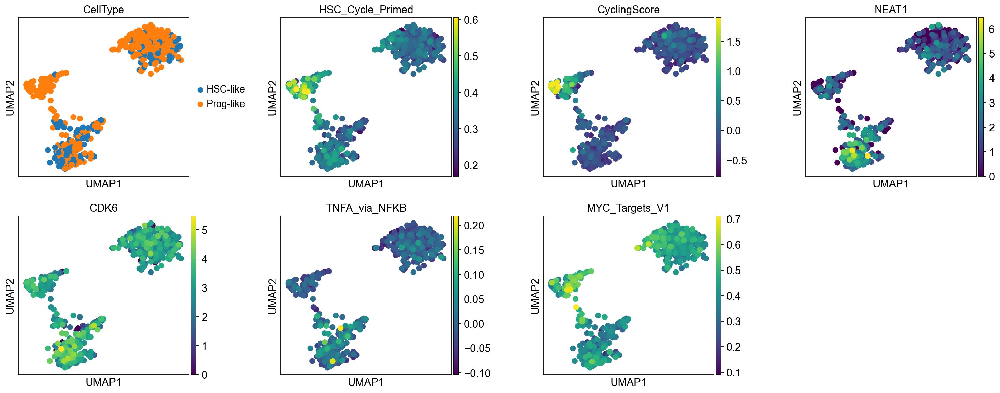

In [91]:
sam707 = sc.external.tl.sam(AML707B[AML707B.obs.CellType.isin(['HSC-like', 'Prog-like'])], standardization="StandardScaler", inplace=True)
sc.pl.umap(sam707.adata, color=['CellType', 'HSC_Cycle_Primed', 'CyclingScore', 'NEAT1', 'CDK6', 'TNFA_via_NFKB', 'MYC_Targets_V1'], wspace=0.4)

In [92]:
sam_AML916_weights = sam916.adata.var['weights']

sam_AML921A_weights = sam921.adata.var['weights']

sam_AML328_weights = sam328.adata.var['weights']

sam_AML707B_weights = sam707.adata.var['weights']

combined_weights = (sam_AML916_weights + sam_AML921A_weights + sam_AML328_weights + sam_AML707B_weights)/4
#combined_weights = (sam_AML916_weights)/1

In [93]:
# top 30 weighted genes 
combined_weights[np.argsort(-combined_weights)].head(30).index

Index(['PCLAF', 'TUBA1B', 'PCNA', 'NEAT1', 'TOP2A', 'MKI67', 'MALAT1', 'DHFR',
       'TUBB', 'HIST1H4C', 'HIST1H1B', 'H2AFZ', 'TK1', 'MDM4', 'ASPM', 'CENPF',
       'HMGB2', 'DUT', 'BIRC5', 'NUSAP1', 'LOC100190986', 'STMN1', 'CRIP1',
       'ANKRD36C', 'SKA3', 'HMMR', 'TPX2', 'MCM4', 'KMT2A', 'UBE2C'],
      dtype='object', name='index')

## Combine all samples that have > 1 HSC-like or Prog-like cells

Load all the diagnostic AML samples

In [738]:
# AML916, AML921A, AML328, AML707B
lab_path="/Users/andyzeng/Drive/Laptop/Dick_Lab/"
AMLcat_dir=lab_path+"scRNA_HSC/sam/scran_normalized/pvg_AML/LSC/LSPC_dormancy/full_hierarchy/"
AMLcat = sc.read_h5ad(AMLcat_dir+'AMLCat_HSCProg_Full_Hierarchy.h5ad')
AMLcat = AMLcat[AMLcat.obs.CellType.isin(['HSC-like', 'Prog-like'])]# & (AMLcat.obs.CyclingBinary == "no")]
AMLcat.obs['old_cluster'] = AMLcat.obs.Cluster

AML916 = AMLcat[AMLcat.obs.batch == "0"]
AML328 = AMLcat[AMLcat.obs.batch == "1"]
AML921A = AMLcat[AMLcat.obs.batch == "2"]
AML707B = AMLcat[AMLcat.obs.batch == "3"]

#score_key_genesets(AML916)
#score_key_genesets(AML328)
#score_key_genesets(AML921A)
#score_key_genesets(AML707B)

#AML_dem_anno_dir = "../../../scRNA_HSC/pvg_AML_samples/data/other/"
AML_dem_anno_dir = AMLcat_dir

AML1012 = load_sample_scran_normalized(AML_dem_anno_dir + "AML1012_AML_hierarchy_normalized_gem.csv", AML_dem_anno_dir + "AML1012_AML_hierarchy_normalized_anno.csv", scale = False, min_cells = 0)
AML210A = load_sample_scran_normalized(AML_dem_anno_dir + "AML210A_AML_hierarchy_normalized_gem.csv", AML_dem_anno_dir + "AML210A_AML_hierarchy_normalized_anno.csv", scale = False, min_cells = 0)
AML329 = load_sample_scran_normalized(AML_dem_anno_dir + "AML329_AML_hierarchy_normalized_gem.csv", AML_dem_anno_dir + "AML329_AML_hierarchy_normalized_anno.csv", scale = False, min_cells = 0)
AML419A = load_sample_scran_normalized(AML_dem_anno_dir + "AML419A_AML_hierarchy_normalized_gem.csv", AML_dem_anno_dir + "AML419A_AML_hierarchy_normalized_anno.csv", scale = False, min_cells = 0)
AML420B = load_sample_scran_normalized(AML_dem_anno_dir + "AML420B_AML_hierarchy_normalized_gem.csv", AML_dem_anno_dir + "AML420B_AML_hierarchy_normalized_anno.csv", scale = False, min_cells = 0)
AML475 = load_sample_scran_normalized(AML_dem_anno_dir + "AML475_AML_hierarchy_normalized_gem.csv", AML_dem_anno_dir + "AML475_AML_hierarchy_normalized_anno.csv", scale = False, min_cells = 0)
AML870 = load_sample_scran_normalized(AML_dem_anno_dir + "AML870_AML_hierarchy_normalized_gem.csv", AML_dem_anno_dir + "AML870_AML_hierarchy_normalized_anno.csv", scale = False, min_cells = 0)
AML556 = load_sample_scran_normalized(AML_dem_anno_dir + "AML556_AML_hierarchy_normalized_gem.csv", AML_dem_anno_dir + "AML556_AML_hierarchy_normalized_anno.csv", scale = False, min_cells = 0)

AMLcat_not_scaled = ad.AnnData.concatenate(AML916, AML328, AML921A, AML1012, AML329, AML419A, AML420B, AML210A,
                                           AML475, AML870, AML707B, AML556, index_unique=None, 
                                           batch_categories =['AML916', 'AML328', 'AML921A', 'AML1012', 'AML329', 'AML419A', 'AML420B', 'AML210A',
                                                              'AML475', 'AML870', 'AML707B', 'AML556'])
AMLcat_not_scaled = AMLcat_not_scaled[AMLcat_not_scaled.obs.CellType.isin(['HSC-like', 'Prog-like'])]


sc.pp.scale(AML328)
sc.pp.scale(AML916)
sc.pp.scale(AML921A)
sc.pp.scale(AML1012)
sc.pp.scale(AML210A)
sc.pp.scale(AML329)
sc.pp.scale(AML419A)
sc.pp.scale(AML420B)
sc.pp.scale(AML475)
sc.pp.scale(AML870)
sc.pp.scale(AML707B)
sc.pp.scale(AML556)
#sc.pp.scale(AML314)
#sc.pp.scale(AML371)
#sc.pp.scale(AML722B)
#sc.pp.scale(AML997)


AMLcat_scaled = ad.AnnData.concatenate(AML916, AML328, AML921A, AML1012, AML329, AML419A, AML420B, AML210A,
                                     AML475, AML870, AML707B, AML556, 
                                       index_unique=None,
                                     batch_categories =['AML916', 'AML328', 'AML921A', 'AML1012', 'AML329', 'AML419A', 'AML420B', 'AML210A',
                                                        'AML475', 'AML870', 'AML707B', 'AML556'])

# Subset with only HSC-like and Prog-like
AMLcat_LSPC = AMLcat_scaled[AMLcat_scaled.obs.CellType.isin(['HSC-like', 'Prog-like'])]
#AMLcat_LSPC.obs = AMLcat_not_scaled[AMLcat_not_scaled.obs.CellType.isin(['HSC-like', 'Prog-like'])].obs

Trying to set attribute `.obs` of view, copying.


# 3 New LSPC Clusters

To classify HSC-like and Prog-like cells from all patients (including those with very few cells), we will take the average feature weights from the four patients with high LSPC abundance and project these onto other samples to run weighted PCA.

In [15]:
def project_feature_weights(adata, weights, preprocessing = 'StandardScaler', metric = "correlation", bbknn = False):
    from sklearn.preprocessing import StandardScaler, Normalizer
    from samalg import ut

    dat = adata.X.copy()
    # Filter for mutual genes between weights and adata
    dat = dat[:,adata.var_names.isin(weights.index)]
    weights = weights[weights.index.isin(adata.var_names)]

    # get top 3000 weighted genes
    top3000 = weights.values.argsort()[-3000:][::-1]
    dat = dat[:,top3000]
    # get matrix and clean it
    if preprocessing == "StandardScaler":
        X = StandardScaler(with_mean=True).fit_transform(dat)
    elif preprocessing == "Normalizer":
        X = Normalizer().fit_transform(dat)
    else:
        X = dat
    # get weights for those top 3000 genes
    w = weights[top3000].values
    # multiple for weighted matrix
    weighted_matrix = X*w

    # get weighted PCA and normalize PCs
    g_weighted, pca = ut.weighted_PCA(weighted_matrix, npcs=150)
    #g_weighted = Normalizer().fit_transform(g_weighted)

    # fill in PCs
    adata.obsm['X_pca'] = g_weighted

    # get neighbours
    if bbknn == True:
        sc.external.pp.bbknn(adata)
    else:
        sc.pp.neighbors(adata, metric = "correlation")

In [756]:
LSC_3cluster = AMLcat_LSPC.copy()
project_feature_weights(LSC_3cluster, combined_weights, preprocessing = 'StandardScaler', bbknn = False)

sc.tl.leiden(LSC_3cluster, resolution=0.15, random_state = 42)

In [757]:
sc.tl.diffmap(LSC_3cluster, n_comps=4)

In [758]:
#LSC_3cluster.obsm['X_diffmap'][:,1] = -LSC_3cluster.obsm['X_diffmap'][:,1]
LSC_3cluster.obsm['X_diffmap'][:,2] = -LSC_3cluster.obsm['X_diffmap'][:,2]

Trying to set attribute `.obs` of view, copying.
... storing 'CellType' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Cluster' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'CyclingBinary' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'MutTranscripts' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'NanoporeTranscripts' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'PredictionRF2' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'PredictionRefined' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'WtTranscripts' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'old_cluster' as categorical


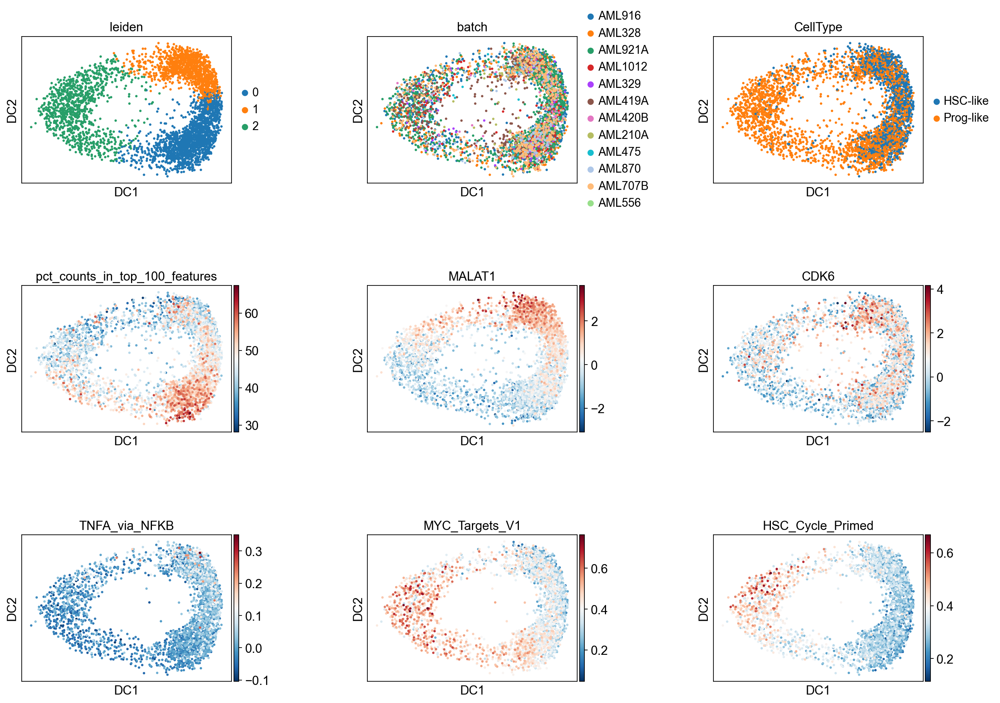

In [119]:
sc.pl.diffmap(LSC_3cluster[LSC_3cluster.obs['pct_counts_in_top_100_features']<80], 
              color = ['leiden', 'batch', 'CellType', 
                       'pct_counts_in_top_100_features', 'MALAT1', 'CDK6', 
                       'TNFA_via_NFKB', 'MYC_Targets_V1', 'HSC_Cycle_Primed'], 
              color_map = 'RdBu_r', wspace = 0.5, ncols=3, hspace = 0.7)#, save = "_LSC_3Cluster_withCycling_newlabels.png")

In [ ]:
LSC_3cluster = np.where(LSC_3cluster.obs['leiden'] == '0', 'LSPC-Quiescent',
                       np.where(LSC_3cluster.obs['leiden'] == '1', 'LSPC-Primed', 'LSPC-Cycle')

### Run Silhouette scores to compare new vs prior classification

In [159]:
samplist = lspc.obs.batch.unique().tolist()
samplist.remove('AML556') # not enough cells
silhouettes = pd.DataFrame(columns=['van Galen 2019', 'SAM Clusters'])

for ptx in samplist:
    temp = pd.DataFrame({'van Galen 2019' : metrics.silhouette_score(lspc[lspc.obs.batch == ptx].obsm['X_umap'], lspc[lspc.obs.batch == ptx].obs['CellType']), 
                         'SAM Clusters' : metrics.silhouette_score(lspc[lspc.obs.batch == ptx].obsm['X_umap'], lspc[lspc.obs.batch == ptx].obs['Cluster'])
                        }, index=[ptx])
    silhouettes = silhouettes.append(temp)
dat = silhouettes.reset_index().melt('index')

In [160]:
silhouettes = pd.DataFrame(columns=['van Galen 2019', 'SAM Clusters'])

for ptx in samplist:
    temp = pd.DataFrame({'van Galen 2019' : metrics.silhouette_score(LSC_3cluster[LSC_3cluster.obs.batch == ptx].obsm['X_umap'], LSC_3cluster[LSC_3cluster.obs.batch == ptx].obs['CellType']), 
                         'SAM Clusters' : metrics.silhouette_score(LSC_3cluster[LSC_3cluster.obs.batch == ptx].obsm['X_umap'], LSC_3cluster[LSC_3cluster.obs.batch == ptx].obs['Cluster'])
                        }, index=[ptx])
    silhouettes = silhouettes.append(temp)
    
datsam = silhouettes.reset_index().melt('index')

In [161]:
silhouettes = pd.DataFrame(columns=['van Galen 2019', 'SAM Clusters'])

for ptx in samplist:
    temp = pd.DataFrame({'van Galen 2019' : metrics.silhouette_score(LSC_3cluster[LSC_3cluster.obs.batch == ptx].obsm['X_pca'], LSC_3cluster[LSC_3cluster.obs.batch == ptx].obs['CellType']), 
                         'SAM Clusters' : metrics.silhouette_score(LSC_3cluster[LSC_3cluster.obs.batch == ptx].obsm['X_pca'], LSC_3cluster[LSC_3cluster.obs.batch == ptx].obs['Cluster'])
                        }, index=[ptx])
    silhouettes = silhouettes.append(temp)
    
datsampca = silhouettes.reset_index().melt('index')

In [171]:
LSC_3cluster.obs['SAM Clusters'] = LSC_3cluster.obs['Cluster']
LSC_3cluster.obs['van Galen 2019'] = LSC_3cluster.obs['CellType']

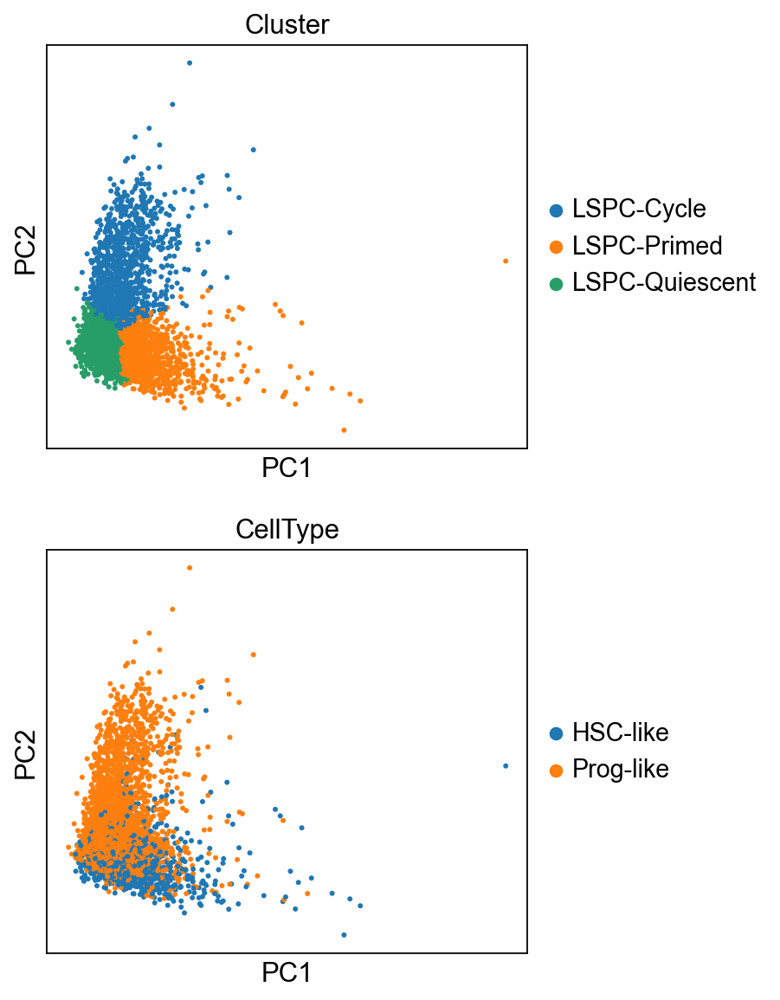

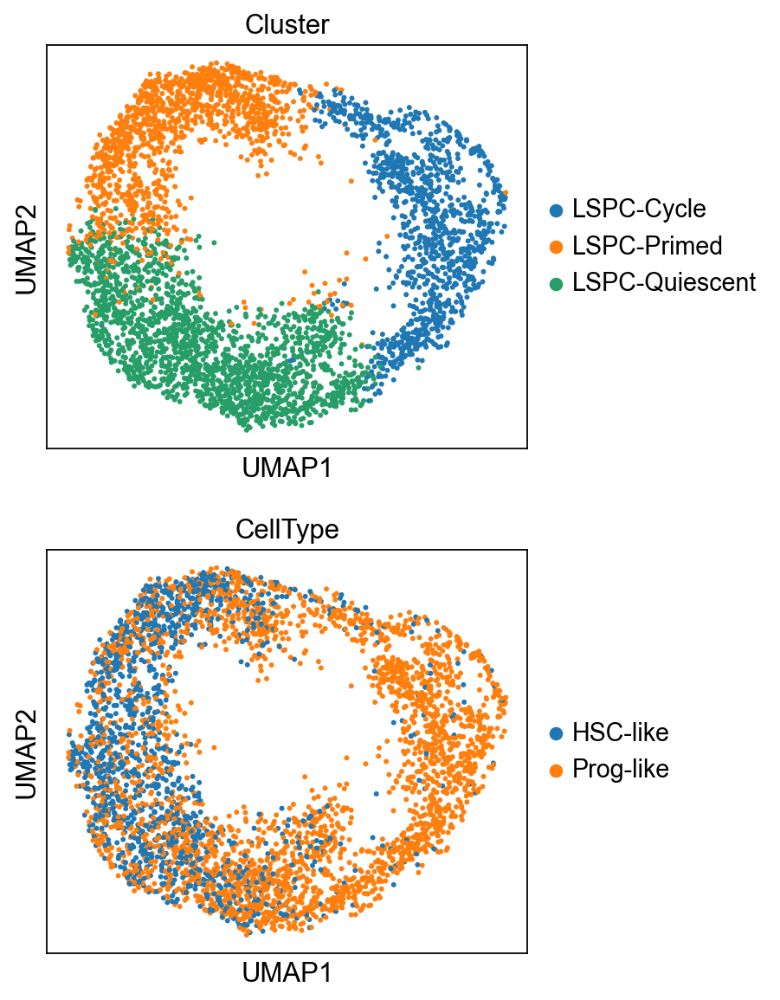

In [174]:
sc.pl.pca(LSC_3cluster, color = ['Cluster', 'CellType'], ncols=1, save = "_SAMpca_Cluster.png")
sc.pl.umap(LSC_3cluster, color = ['Cluster', 'CellType'], ncols=1, save = "_SAMumap_Cluster.png")

In [175]:
lspc.obs['SAM Clusters'] = lspc.obs['Cluster']
lspc.obs['van Galen 2019'] = lspc.obs['CellType']

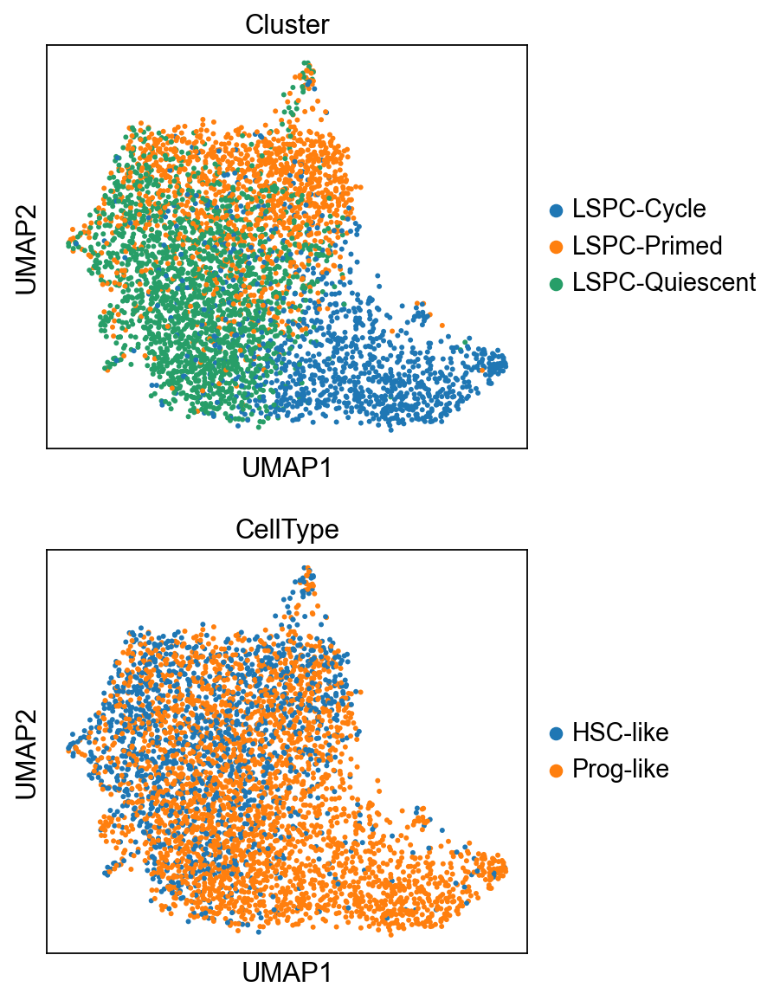

In [176]:
sc.pl.umap(lspc, color = ['Cluster', 'CellType'], ncols=1, save = "_HVGumap_Cluster.png")

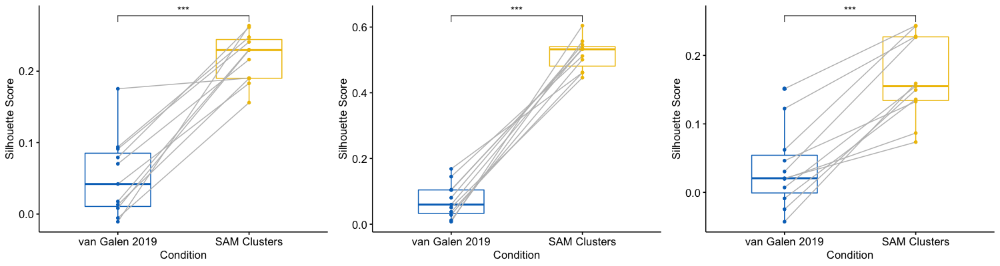

In [168]:
%%R -i dat -i datsam -i datsampca -h 4 -w 15  --units in -r 100
library(ggpubr)
library(tidyverse)

comparison <- list(c('van Galen 2019', 'SAM Clusters'))

ggarrange(
    ggpaired(datsampca, x = 'variable', y = 'value', 
            color = 'variable', line.color = 'grey', palette = 'jco', legend='none') +
        ylab('Silhouette Score') +
        stat_compare_means(comparisons = comparison, label ='p.signif', paired=TRUE),

    ggpaired(datsam, x = 'variable', y = 'value', 
            color = 'variable', line.color = 'grey', palette = 'jco', legend='none') +
        ylab('Silhouette Score') +
        stat_compare_means(comparisons = comparison, label ='p.signif', paired=TRUE),
    
    ggpaired(dat, x = 'variable', y = 'value', 
            color = 'variable', line.color = 'grey', palette = 'jco', legend='none') +
        ylab('Silhouette Score') +
        stat_compare_means(comparisons = comparison, label ='p.signif', paired=TRUE),

    ncol=3
) + ggsave('Silhouette_Scores_LSPConly_SAMpca_SAMumap_HVGumap.png', height=4, width=15)

# Checkpoint - Reload data

In [8]:
LSPC = sc.read_h5ad('Data/Fig1_SingleCell_LSC/scAML_LSPC_scran_reclustered.h5ad')

In [294]:
malobs = malignant.obs[['HALLMARK_TNFA_SIGNALING_VIA_NFKB', 'HALLMARK_HYPOXIA', 'HALLMARK_CHOLESTEROL_HOMEOSTASIS', 'HALLMARK_MITOTIC_SPINDLE', 'HALLMARK_WNT_BETA_CATENIN_SIGNALING', 'HALLMARK_TGF_BETA_SIGNALING', 'HALLMARK_IL6_JAK_STAT3_SIGNALING', 'HALLMARK_DNA_REPAIR', 'HALLMARK_G2M_CHECKPOINT', 'HALLMARK_APOPTOSIS', 'HALLMARK_NOTCH_SIGNALING', 'HALLMARK_ADIPOGENESIS', 'HALLMARK_ESTROGEN_RESPONSE_EARLY', 'HALLMARK_ESTROGEN_RESPONSE_LATE', 'HALLMARK_ANDROGEN_RESPONSE', 'HALLMARK_MYOGENESIS', 'HALLMARK_PROTEIN_SECRETION', 'HALLMARK_INTERFERON_ALPHA_RESPONSE', 'HALLMARK_INTERFERON_GAMMA_RESPONSE', 'HALLMARK_APICAL_JUNCTION', 'HALLMARK_APICAL_SURFACE', 'HALLMARK_HEDGEHOG_SIGNALING', 'HALLMARK_COMPLEMENT', 'HALLMARK_UNFOLDED_PROTEIN_RESPONSE', 'HALLMARK_PI3K_AKT_MTOR_SIGNALING', 'HALLMARK_MTORC1_SIGNALING', 'HALLMARK_E2F_TARGETS', 'HALLMARK_MYC_TARGETS_V1', 'HALLMARK_MYC_TARGETS_V2', 'HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION', 'HALLMARK_INFLAMMATORY_RESPONSE', 'HALLMARK_XENOBIOTIC_METABOLISM', 'HALLMARK_FATTY_ACID_METABOLISM', 'HALLMARK_OXIDATIVE_PHOSPHORYLATION', 'HALLMARK_GLYCOLYSIS', 'HALLMARK_REACTIVE_OXYGEN_SPECIES_PATHWAY', 'HALLMARK_P53_PATHWAY', 'HALLMARK_UV_RESPONSE_UP', 'HALLMARK_UV_RESPONSE_DN', 'HALLMARK_ANGIOGENESIS', 'HALLMARK_HEME_METABOLISM', 'HALLMARK_COAGULATION', 'HALLMARK_IL2_STAT5_SIGNALING', 'HALLMARK_BILE_ACID_METABOLISM', 'HALLMARK_PEROXISOME', 'HALLMARK_ALLOGRAFT_REJECTION', 'HALLMARK_SPERMATOGENESIS', 'HALLMARK_KRAS_SIGNALING_UP', 'HALLMARK_KRAS_SIGNALING_DN', 'HALLMARK_PANCREAS_BETA_CELLS', 'HSC_Cycle_Primed', 'colon_diapause_up', 'colon_diapause_down', 'LSPC_Immune_Activated', 'LSPC_Differentiating', 'TNFa_GMP_all', 'TNFa_HSC_only', 'TNFa_GMP_only', 'TNFa_Common', 'mir130aOEdn', 'LSC104_UP', 'LSC104_DOWN', 'GBM_Developmental_top250', 'GBM_Injury_Response_top250', 'GBM_Developmental_L1genes', 'GBM_Injury_Response_L1genes', 'GBM_GSC_Line_vs_Tumor', 'TFEB_HSC', 'TFEB_MPP', 'TFEB_GMP', 'MYC_OE_HSC', 'KEGG_Lysosome', 'ATF4_upregulated_vanGalen2018', 'ATF4_Downregulated_vanGalen2018', 'Tirosh_Cycle_Genes', 'Ng_Stemness_Genes', 'Protein_Folding', 'S1PR3_OE_LTHSC', 'S1PR3_OE_MPP', 'S1PR3_OE_LTHSC_MPP_Shared', 'vanGalen_AML_HSCProg', 'vanGalen_AML_GMP', 'vanGalen_AML_Myeloid', 'Fares_HSC_common', 'aHSC_vs_qHSC_top250', 'qHSC_vs_aHSC_top250', 'aHSC_vs_qHSC_top100', 'qHSC_vs_aHSC_top100', 'Somervaille_MLL_LSC_Up', 'Somervaille_MLL_LSC_Down', 'Eppert_LSC', 'LSPC.Quiescent', 'LSPC.Primed.Top250', 'LSPC.Primed.Top100', 'LSPC.Cycle.Top250', 'LSPC.Cycle.Top100', 'GMP.like.Top250', 'GMP.like.Top100', 'ProMono.like.Top250', 'ProMono.like.Top100', 'Mono.like.Top250', 'Mono.like.Top100', 'cDC.like.Top250', 'cDC.like.Top100', 'BEAT_Ven_Resistant_Top100', 'BEAT_Ven_Sensitive_Top100', 'Dicklab_LT.HSC_Top100', 'Dicklab_ST.HSC_Top100', 'Dicklab_CMP_Top100', 'Dicklab_GMP_Top100', 'Dicklab_MLP_Top100', 'Dicklab_GrMono_Top100', 'Cluster', 'shannon', 'ribosome_scran']]

In [295]:
LSPC.obs = LSPC.obs.drop(['HSC_Cycle_Primed', 'LSC104_DOWN', 'LSC104_UP', 'Cluster'],axis=1).join(malobs)

## Add Regulon Scores from pySCENIC

In [22]:
regulons = pd.read_csv("Data/Fig1_SingleCell_LSC/scAML_pySCENIC_regulons_AUCell.csv").set_index('Cell')
regulons

,AEBP2(+),AHR(+),AHRR(+),ALX4(+),AR(+),ARGFX(+),ARID3A(+),ARNT(+),ARNTL(+),ARNTL2(+),...,ZNF841(+),ZNF845(+),ZNF879(+),ZNF90(+),ZNF91(+),ZNF92(+),ZSCAN16(+),ZSCAN18(+),ZSCAN22(+),ZXDA(+)
Cell,,,,,,,,,,,,,,,,,,,,,
AML328-D0_AAAAACAGAAGT,0.033954,0.057152,0.115566,0.051685,0.024064,0.041022,0.049510,0.066630,0.081360,0.010010,...,0.000000,0.000000,0.029823,0.002372,0.113161,0.000000,0.000000,0.0,0.000000,0.0
AML328-D0_AAAACCGCTACT,0.012157,0.049059,0.000000,0.014789,0.008208,0.000000,0.038504,0.050247,0.049530,0.024220,...,0.043579,0.145856,0.022175,0.000000,0.128028,0.000000,0.022175,0.0,0.000000,0.0
AML328-D0_AAAACCGGCTTT,0.043177,0.038645,0.000000,0.000000,0.008182,0.000000,0.029349,0.056621,0.040117,0.017609,...,0.000000,0.000000,0.000000,0.000000,0.110757,0.000000,0.000000,0.0,0.000000,0.0
AML328-D0_AAAAGCTTATCA,0.028444,0.042139,0.000000,0.043757,0.006403,0.003402,0.011723,0.045458,0.060948,0.018775,...,0.239061,0.000000,0.026325,0.000000,0.127208,0.000000,0.026503,0.0,0.000000,0.0
AML328-D0_AAAAGTCCCCGT,0.000000,0.077529,0.000000,0.000000,0.013315,0.006070,0.098736,0.060342,0.103358,0.012668,...,0.000000,0.000000,0.006641,0.000000,0.097796,0.000000,0.025258,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AML556-D0_TTCAGTAGAATG,0.025219,0.051285,0.127154,0.025004,0.003278,0.000000,0.046525,0.057025,0.052641,0.029082,...,0.000000,0.000000,0.093857,0.000000,0.118320,0.038776,0.029349,0.0,0.000000,0.0
AML556-D0_TTCTAAACATTN,0.024129,0.092539,0.000000,0.000000,0.013442,0.000000,0.055997,0.127866,0.088162,0.021799,...,0.077730,0.000000,0.044112,0.000000,0.101565,0.000000,0.009783,0.0,0.000000,0.0
AML556-D0_TTGGTGAGATCT,0.026576,0.050166,0.000000,0.057478,0.008690,0.009405,0.043056,0.072572,0.049261,0.015682,...,0.000000,0.000000,0.001423,0.006403,0.126812,0.072750,0.000000,0.0,0.130736,0.0


In [23]:
LSPC.obs = LSPC.obs.join(regulons)

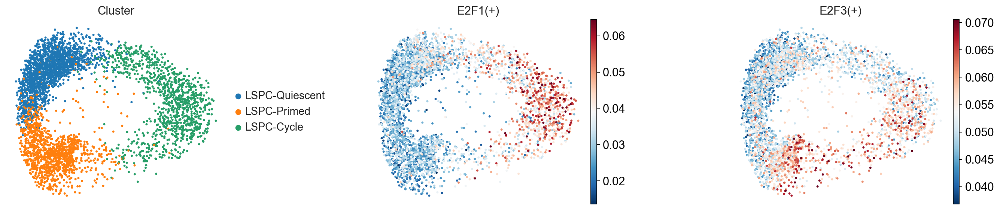

In [801]:
sc.pl.diffmap(LSPC, color=['Cluster', 'E2F1(+)', 'E2F3(+)'], frameon=False, wspace=0.5, cmap='RdBu_r', vmin='p1', vmax='p99.5')

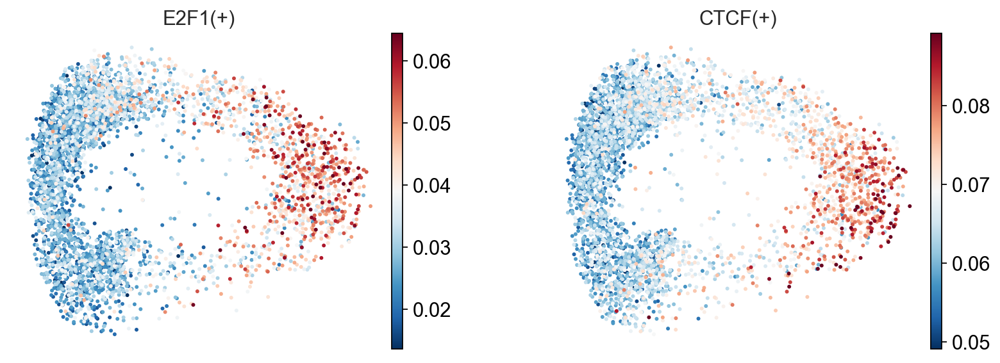

In [883]:
sc.set_figure_params(scanpy=True, dpi_save=320, figsize=[4.5,4])
sc.pl.diffmap(LSPC, color=['E2F1(+)', 'CTCF(+)'], frameon=False, wspace=0.3, cmap='RdBu_r',vmin='p1', vmax='p99.5')

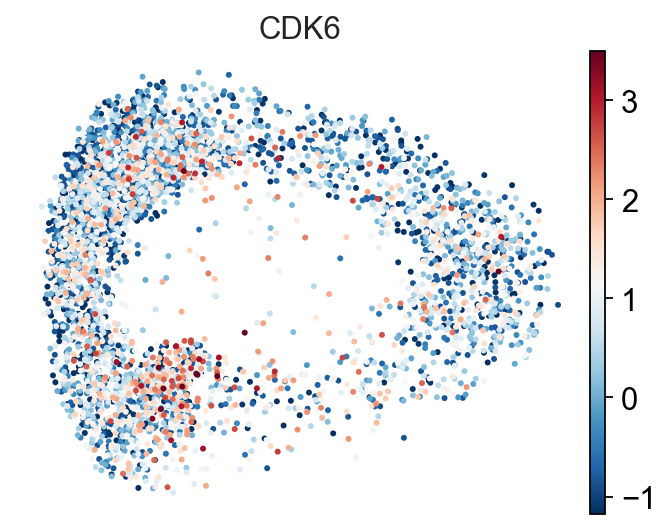

In [872]:
sc.pl.diffmap(LSPC, color=['CDK6'], frameon=False, wspace=0.5, cmap='RdBu_r', vmin='p5', vmax='p99.8')

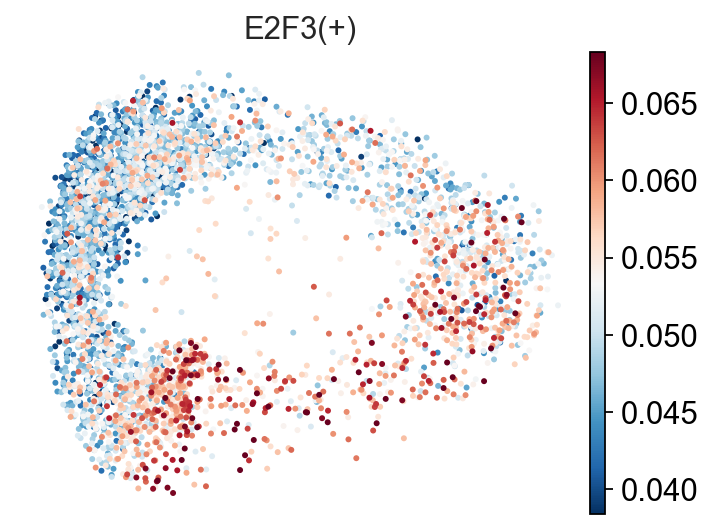

In [864]:
sc.pl.diffmap(LSPC, color=['E2F3(+)'], frameon=False, wspace=0.5, cmap='RdBu_r', vmin='p2', vmax='p99')

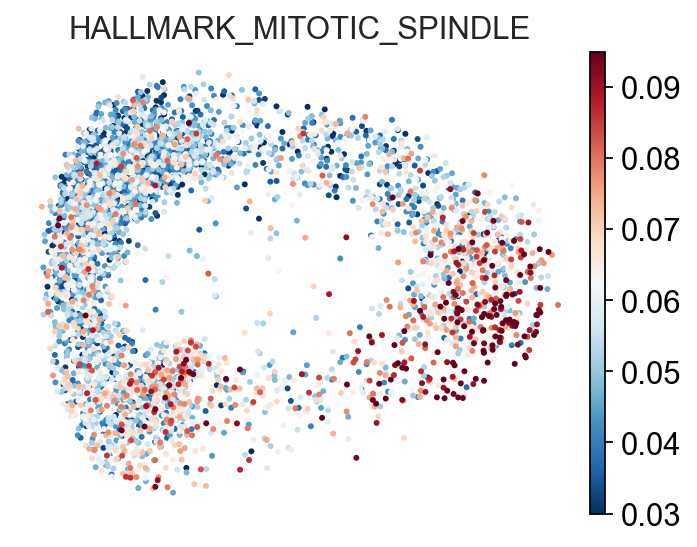

In [899]:
sc.pl.diffmap(LSPC, color=['HALLMARK_MITOTIC_SPINDLE'], frameon=False, wspace=0.5, cmap='RdBu_r', vmin='p5', vmax='p97.5')

In [831]:
LSPC.obs['Clust'] = LSPC.obs['Cluster'].str.replace('LSPC-', '').str.replace('Cycle', 'Cycling') + ' LSPC'
LSPC.obs['Clust'] = LSPC.obs['Clust'].astype('category').cat.set_categories(['Quiescent LSPC', 'Primed LSPC', 'Cycling LSPC'])
LSPC.obs['Patient'] = LSPC.obs['batch']
LSPC.obs['Old Classification'] = LSPC.obs['CellType']

In [923]:
LSPC.obs['Cluster'] = LSPC.obs['Clust']

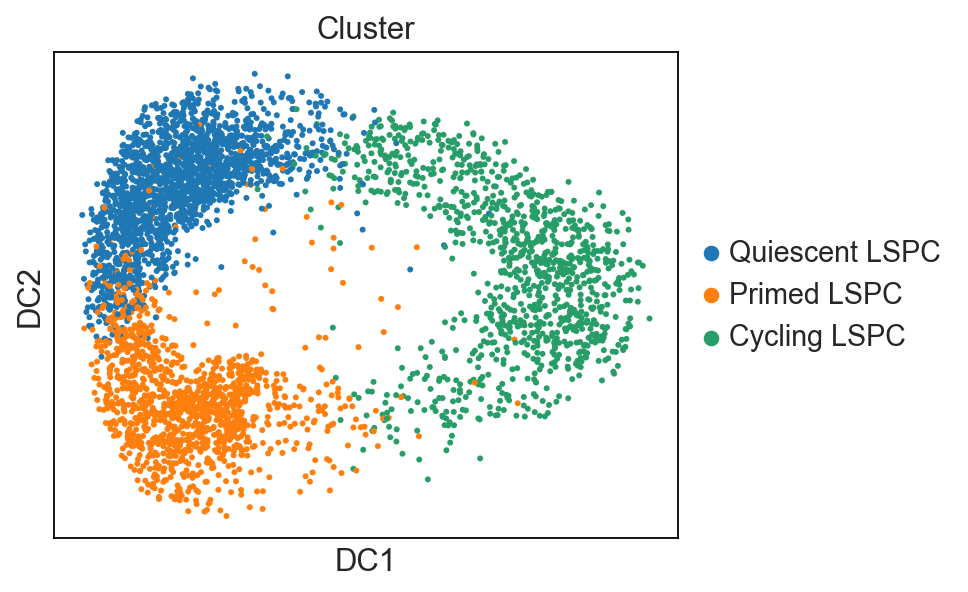

In [926]:
sc.set_figure_params(scanpy=True, dpi_save=320, figsize=[5,4])
sc.pl.diffmap(LSPC, color=['Cluster'], frameon=True, wspace=0.5, cmap='RdBu_r', vmin='p0', vmax='p99.5')

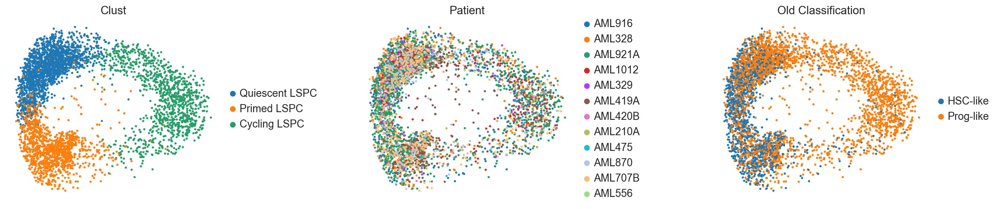

In [841]:
sc.pl.diffmap(LSPC, color=['Clust', 'Patient', 'Old Classification'], frameon=False, wspace=0.5, cmap='RdBu_r', vmin='p0', vmax='p99.5')

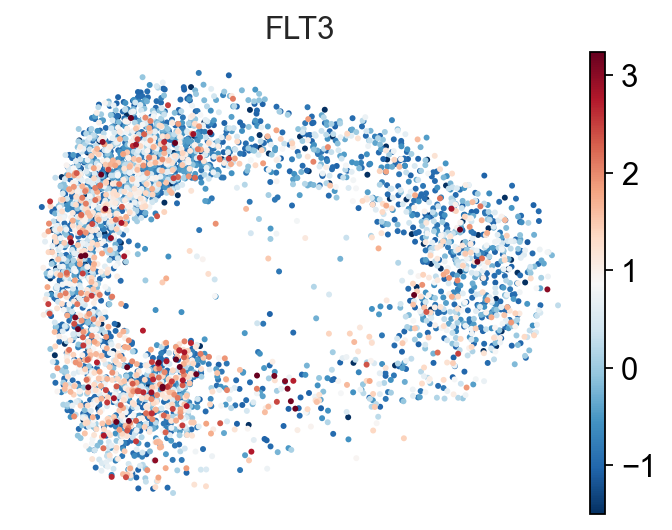

In [898]:
sc.set_figure_params(scanpy=True, dpi_save=320, figsize=[5,3.8])
sc.pl.diffmap(LSPC, color=['FLT3'], frameon=False, wspace=0.5, cmap='RdBu_r', vmin='p0', vmax='p99.5')

In [1091]:
LSPC.obs['LSC+ Fractions - Upregulated'] = LSPC.obs['LSC104_UP']

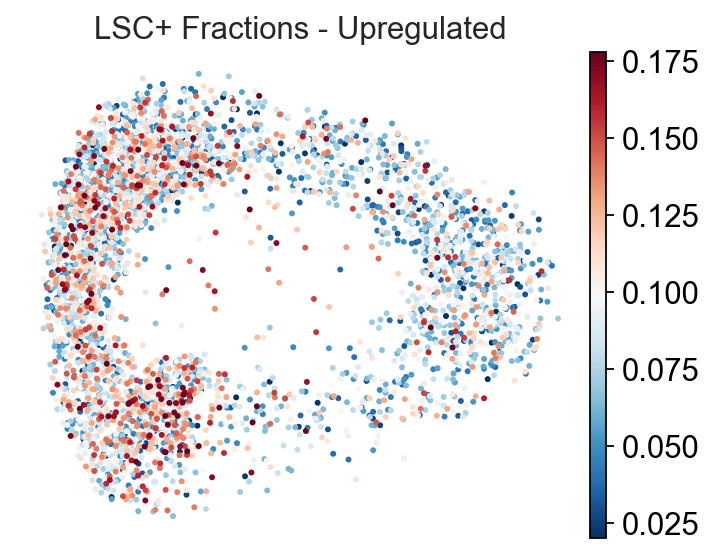

In [1092]:
sc.pl.diffmap(LSPC, color=['LSC+ Fractions - Upregulated'], frameon=False, wspace=0.5, cmap='RdBu_r', vmin='p2', vmax='p99')

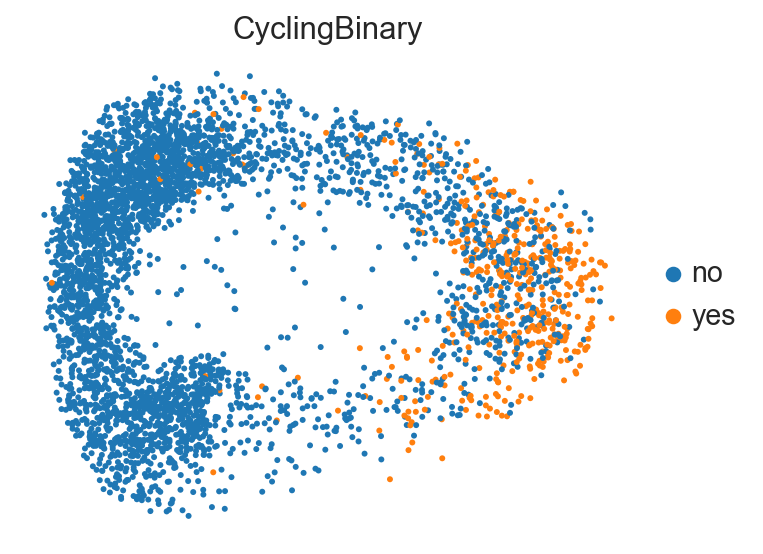

In [848]:
sc.pl.diffmap(LSPC, color=['CyclingBinary'], frameon=False, wspace=0.5, cmap='RdBu_r', vmin='p2', vmax='p99')#, groups=['yes'])

In [838]:
#LSPC.obs['Cluster'] = LSPC.obs['Cluster'].cat.set_categories(['LSPC-Quiescent', 'LSPC-Primed', 'LSPC-Cycle'])

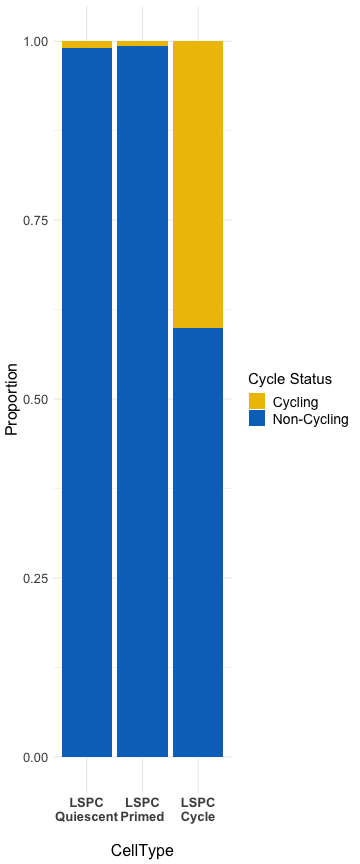

In [1066]:
%%R -i cycle --units in -h 12 -w 5

library(tidyverse)
library(ggpubr)
library(ggsci)

cycle %>% 
    rownames_to_column('Cycle Status') %>%
    pivot_longer(-`Cycle Status`, 'Celltype') %>% 
    mutate(Proportion = value/100) %>% 
    select(-value) %>% 
    mutate(Celltype = factor(Celltype %>% str_replace('-','\n'), levels=c('LSPC\nQuiescent', 'LSPC\nPrimed', 'LSPC\nCycle')), 
           `Cycle Status` = factor(ifelse(`Cycle Status` == 'no', 'Non-Cycling', 'Cycling'))) %>% 
    ggplot(aes(x = Celltype, y = Proportion, fill = `Cycle Status`)) + 
    geom_col() + 
    scale_fill_manual(values=c('#EFC000FF', '#0073C2FF')) +
    theme_minimal() + 
    xlab('\nCellType') +
    theme(axis.text.y = element_text(size=13), axis.text.x = element_text(size=13, face='bold'), axis.title = element_text(size=16), legend.text = element_text(size=14), legend.title = element_text(size=15))


## Downsample and Calculate Transcriptional Entropy

Load raw counts with new LSPC annotations

In [11]:
scAML_raw = sc.read_h5ad('Data/Fig1_SingleCell_LSC/scAML_reannotated_rawcounts.h5ad')

In [242]:
scAML_raw.obs['ribosome_raw'] = scAML_raw[:,scAML_raw.var_names[scAML_raw.var_names.str.contains("^RPS[0-9]*$") | scAML_raw.var_names.str.contains("^RPL[0-9]*$")]].X.mean(axis=1)

/Users/andyzeng/opt/anaconda3/envs/singlecell/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/andyzeng/opt/anaconda3/envs/singlecell/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/andyzeng/opt/anaconda3/envs/singlecell/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword wil

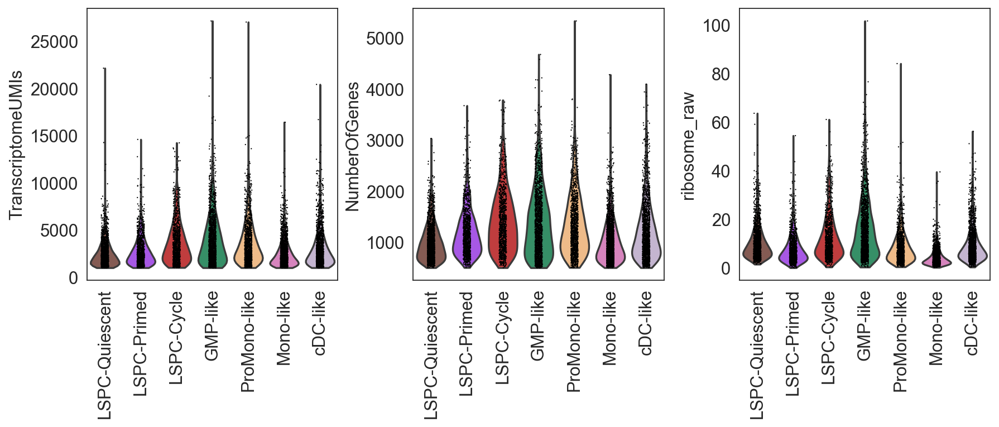

In [243]:
sc.pl.violin(scAML_raw, keys=['TranscriptomeUMIs', 'NumberOfGenes', 'ribosome_raw'], groupby='Cluster', rotation=90, 
             order=['LSPC-Quiescent', 'LSPC-Primed', 'LSPC-Cycle', 'GMP-like', 'ProMono-like', 'Mono-like', 'cDC-like'])

In [244]:
import skbio
scAML_raw.obs['shannon_index_full'] = [skbio.diversity.alpha.shannon(x) for x in scAML_raw.X]
scAML_raw.obs['shannon_index_full'] = scAML_raw.obs['shannon_index_full'] / scAML_raw.obs['shannon_index_full'].max()

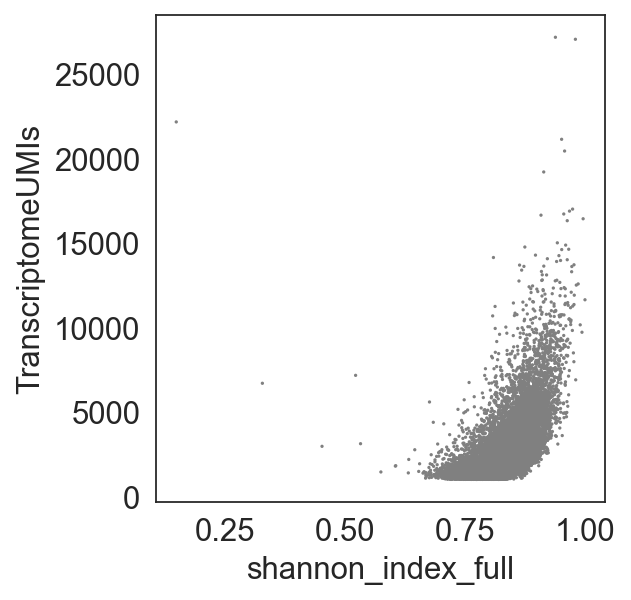

In [245]:
sc.pl.scatter(scAML_raw, x='shannon_index_full', y='TranscriptomeUMIs')

In [246]:
scAML_raw.X.sum(axis=1).min()

1000.0

Here, shannon diversity corelates with transcriptome UMIs. To control for this we will downsample every cell to 1000 UMIs and re-calculate shannon diversity

In [247]:
sc.pp.downsample_counts(scAML_raw, counts_per_cell=1000)

In [248]:
scAML_raw.obs['shannon_index_downsamp'] = [skbio.diversity.alpha.shannon(x) for x in scAML_raw.X]
scAML_raw.obs['shannon_index_downsamp'] = scAML_raw.obs['shannon_index_downsamp'] / scAML_raw.obs['shannon_index_downsamp'].max()

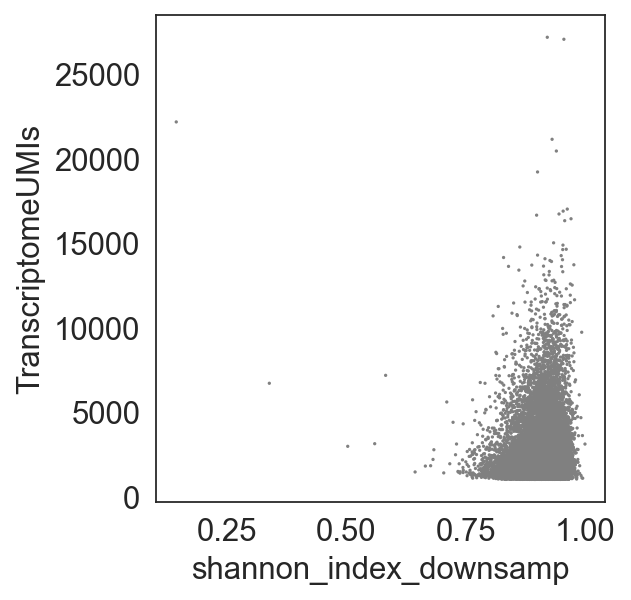

In [249]:
sc.pl.scatter(scAML_raw, x='shannon_index_downsamp', y='TranscriptomeUMIs')

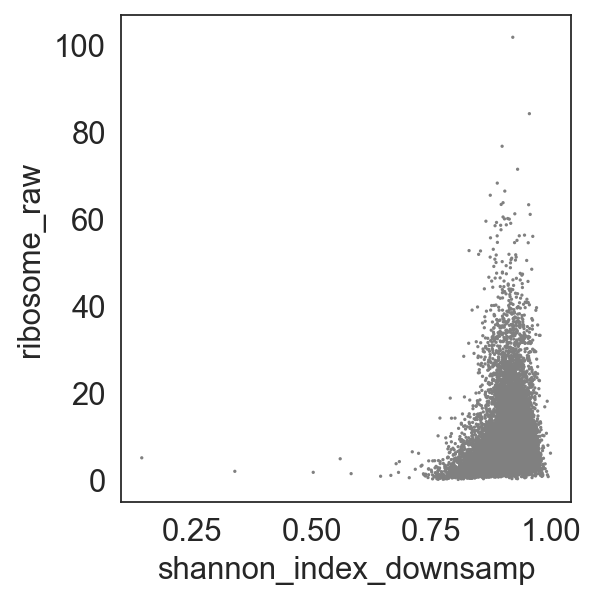

In [250]:
sc.pl.scatter(scAML_raw, x='shannon_index_downsamp', y='ribosome_raw')

/Users/andyzeng/opt/anaconda3/envs/singlecell/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/andyzeng/opt/anaconda3/envs/singlecell/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/andyzeng/opt/anaconda3/envs/singlecell/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword wil

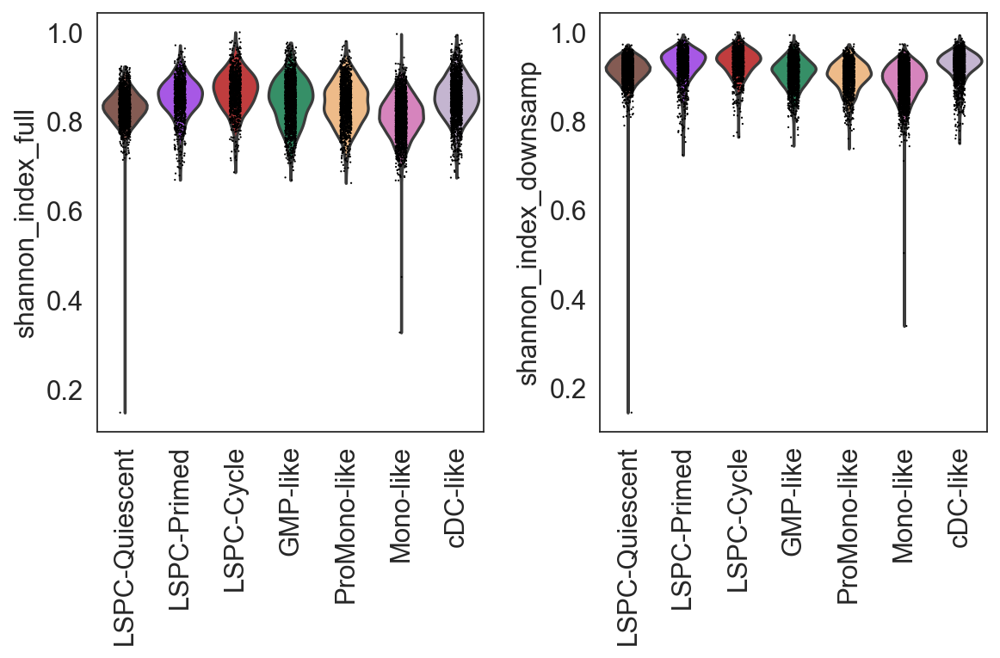

In [251]:
sc.pl.violin(scAML_raw, keys=['shannon_index_full', 'shannon_index_downsamp'], groupby='Cluster', rotation=90, 
             order=['LSPC-Quiescent', 'LSPC-Primed', 'LSPC-Cycle', 'GMP-like', 'ProMono-like', 'Mono-like', 'cDC-like'])

In [252]:
# scAML_raw.obs['shannon_index_full'] = scAML_raw.obs['shannon_index_full'] / scAML_raw.obs['shannon_index_full'].max()
# scAML_raw.obs['shannon_index_downsamp'] = scAML_raw.obs['shannon_index_downsamp'] / scAML_raw.obs['shannon_index_downsamp'].max()

/Users/andyzeng/opt/anaconda3/envs/singlecell/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/andyzeng/opt/anaconda3/envs/singlecell/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/andyzeng/opt/anaconda3/envs/singlecell/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword wil

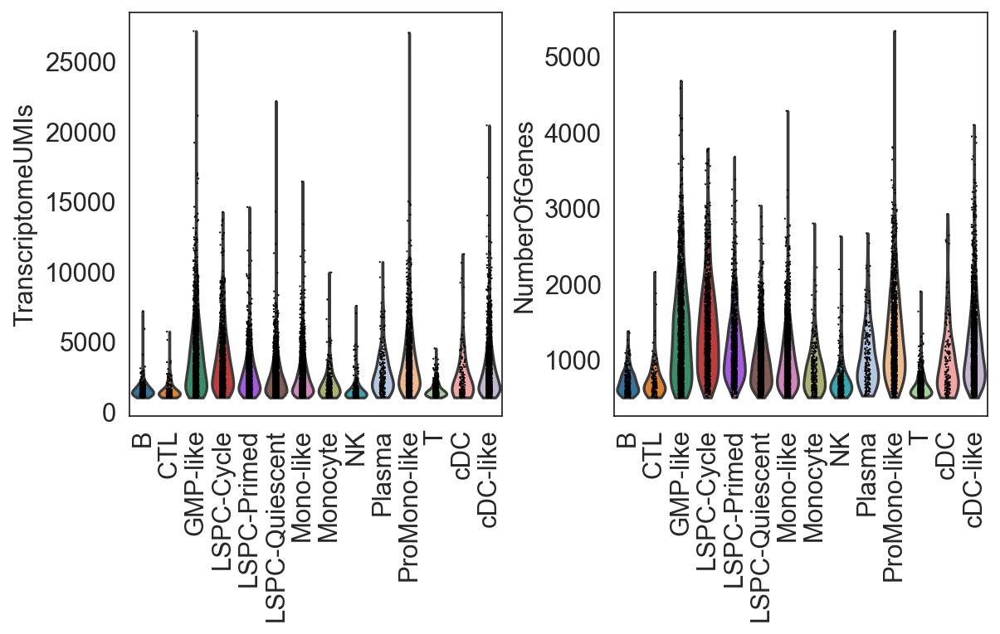

In [253]:
sc.pl.violin(scAML_raw, keys=['TranscriptomeUMIs', 'NumberOfGenes'], groupby='Cluster', rotation=90)

In [254]:
scAML_raw.obs['Clust'] = scAML.obs.Cluster.str.replace('-','\n')

In [18]:
from seaborn.categorical import _ViolinPlotter

class MyVPlot(_ViolinPlotter):
    def draw_quartiles(self, ax, data, support, density, center, split=False):
        """Draw the quartiles as lines at width of density."""
        q25, q50, q75 = np.percentile(data, [25, 50, 75])
        self.draw_to_density(ax, center, q50, support, density, split,
                             linewidth=self.linewidth, )

def my_violinplot(x=None, y=None, hue=None, data=None, order=None, hue_order=None,
                  bw="scott", cut=2, scale="area", scale_hue=True, gridsize=100,
                  width=.8, inner="box", split=False, dodge=True, orient=None,
                  linewidth=None, color=None, palette=None, saturation=.75,
                  ax=None, **kwargs):
    plotter = MyVPlot(x, y, hue, data, order, hue_order,
                      bw, cut, scale, scale_hue, gridsize,
                      width, inner, split, dodge, orient, linewidth,
                      color, palette, saturation)
    if ax is None:
        ax = plt.gca()
    plotter.plot(ax)
    return ax

def violin_category(data, category, score, xlab = None, ylab = None, order=["Low", "High"], boxpairlist=[("Low", "High")], textformat = "star", swarm=True, swarmsize=5):
    data = data.obs
    p1 = my_violinplot(data = data, x = category, y = score, scale='width', order=order, inner="quartile")
    if swarm==True:
        p1 = sns.swarmplot(data = data, x = category, y = score, order=order, color="black", size = swarmsize)
    add_stat_annotation(p1, data=data, x= category, y= score, order=order, box_pairs=boxpairlist,
                        test='t-test_ind', text_format= textformat, loc='outside', verbose=0)
    if xlab != None:
        plt.xlabel(xlab)
    if ylab != None:
        plt.ylabel(ylab)
    sns.despine()

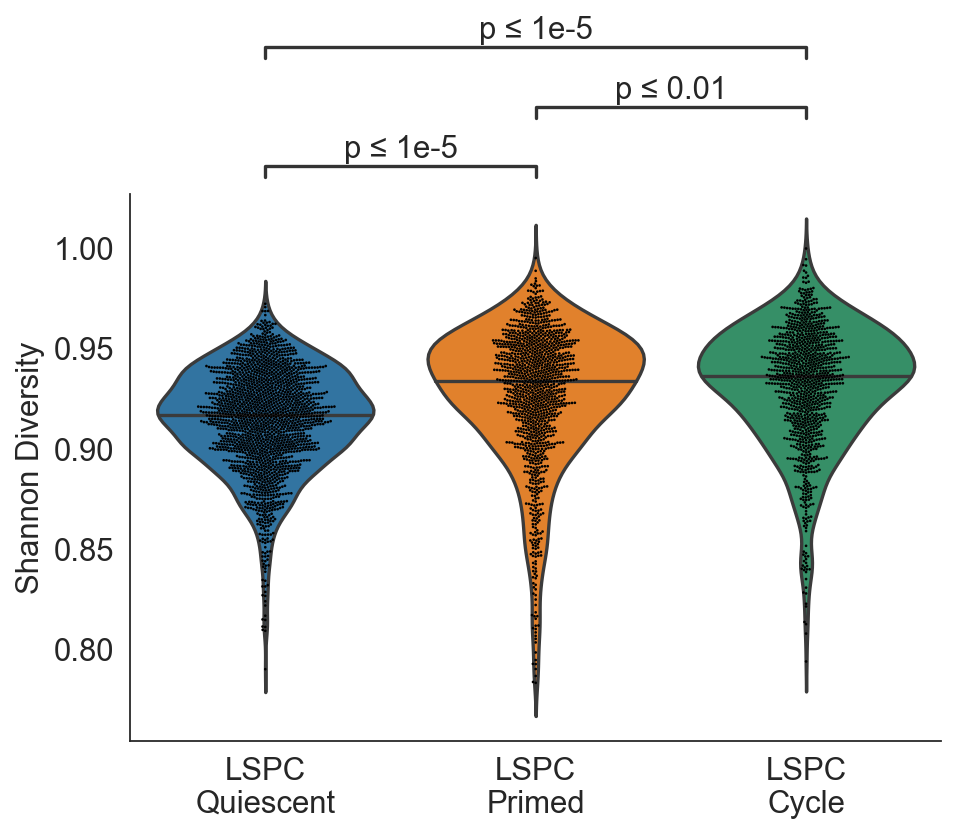

In [256]:
sns.set_style('white')
plt.figure(figsize=[6.5,4.5])
tk.violin_category(scAML_raw[scAML_raw.obs['shannon_index_downsamp'] > 0.78], 'Clust', 'shannon_index_downsamp', xlab='',  ylab='Shannon Diversity', 
                   order=['LSPC\nQuiescent', 'LSPC\nPrimed', 'LSPC\nCycle'], 
                   boxpairlist=[('LSPC\nQuiescent', 'LSPC\nPrimed'), ('LSPC\nQuiescent','LSPC\nCycle'), ('LSPC\nPrimed','LSPC\nCycle')], swarmsize=1.2, textformat='simple')

In [ ]:
LSPC.obs['Shannon Diversity'] = scAML_raw[LSPC.obs_names,:].obs['shannon_index_downsamp']

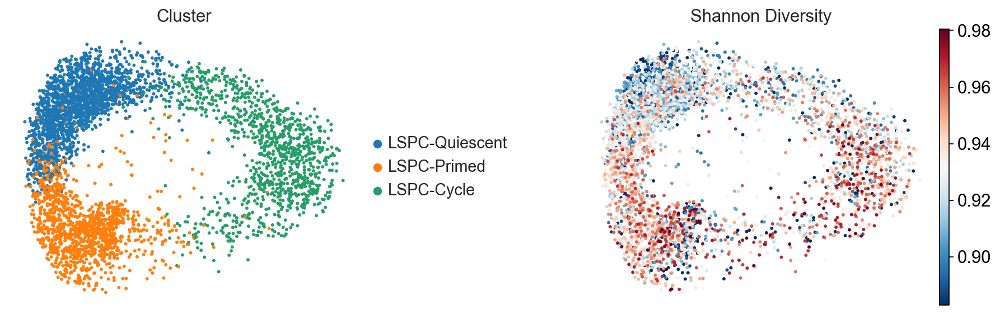

In [797]:
sc.set_figure_params(scanpy=True, dpi_save=320, figsize=[4.5,4])
sc.pl.diffmap(LSPC, color=['Cluster', 'Shannon Diversity'], frameon=False, wspace=0.5, cmap='RdBu_r', vmin='p10', vmax='p99.5')

# Additional Regulon Analysis

## TNFa and NFKB

In [1056]:
newdat = ad.AnnData(LSPC.obs[['HALLMARK_TNFA_SIGNALING_VIA_NFKB', 'HALLMARK_INFLAMMATORY_RESPONSE', 'S1PR3_OE_LTHSC', 'NFKB1(+)', 'NFKB2(+)', 'REL(+)']], obs = LSPC.obs[['Clust']])
newdat

AnnData object with n_obs × n_vars = 4163 × 6
    obs: 'Clust'

In [1057]:
sc.pp.scale(newdat)

In [1059]:
newdat.var_names = ['TNFa Signaling via NFKB', 'Inflammatory Response', 'S1PR3 OE DEGs', 'NFKB1 (+)', 'NFKB2 (+)', 'REL (+)']

In [1060]:
#newdat.obs['Cluster'] = newdat.obs['Cluster'].astype('category').cat.set_categories(['LSPC-Quiescent', 'LSPC-Primed', 'LSPC-Cycle'])

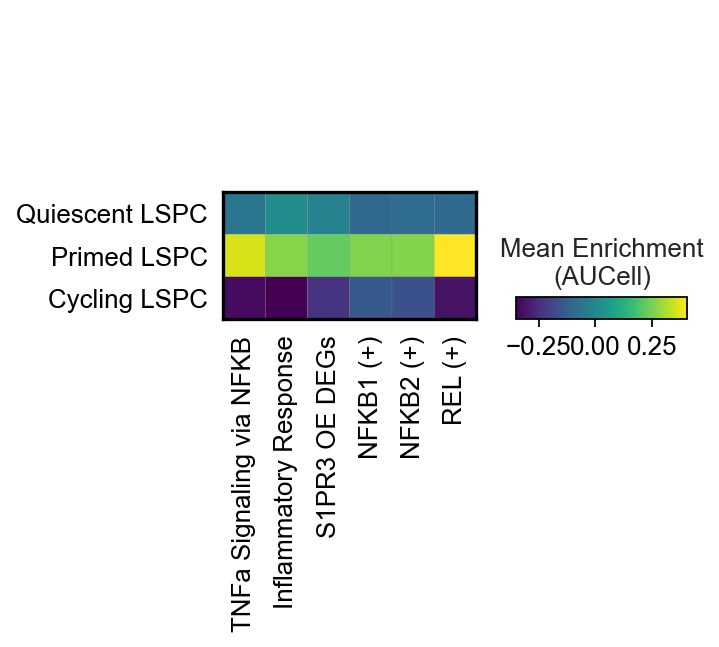

In [1061]:
sc.pl.matrixplot(newdat, var_names=newdat.var_names, groupby='Clust', cmap='viridis', colorbar_title='Mean Enrichment\n(AUCell)')

## More Regulons

In [1079]:
tf = ad.AnnData(regulons.loc[LSPC.obs.index], obs=LSPC.obs[['Cluster']])
tf

AnnData object with n_obs × n_vars = 4163 × 471
    obs: 'Cluster'

In [1080]:
sc.pp.scale(tf)

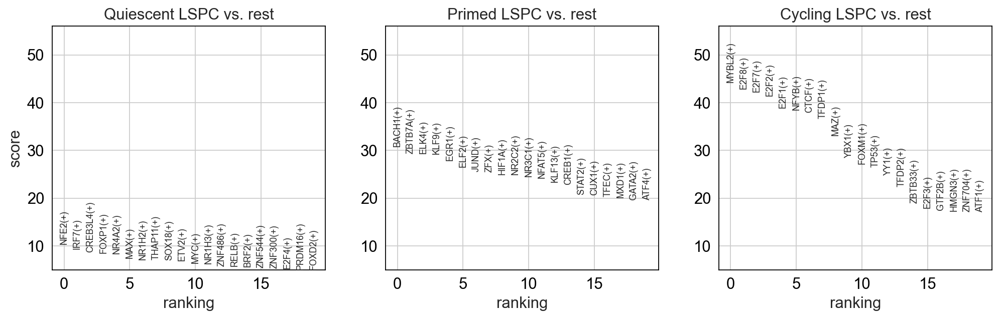

In [1084]:
sc.tl.rank_genes_groups(tf, groupby='Cluster', method='wilcoxon')
sc.pl.rank_genes_groups(tf)

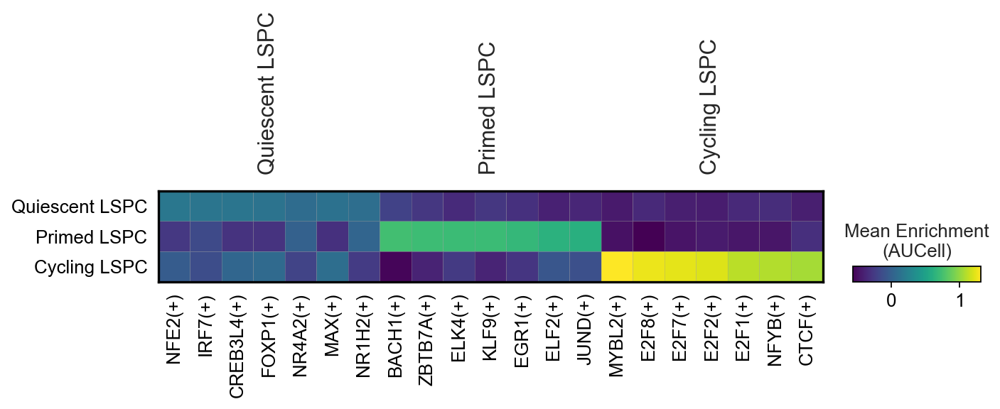

In [1087]:
sc.pl.rank_genes_groups_matrixplot(tf, n_genes=7, dendrogram=False, colorbar_title='Mean Enrichment\n(AUCell)')